# Lane Finding Pipeline
### May 1st, 2017
## Satchel Grant

### Overview
The goal of this notebook is to use camera calibration, perspective transforms, color filtering, and polynomial fitting for advanced lane detection in images of roads.

In [1]:
# External Imports
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Internal Imports
import calibration as calib
import lanes
import filters
import inout


In [2]:
def show1(img, description="Image",path=None):
    plt.imshow(img)
    plt.title(description)
    if path:
        plt.savefig(path)
    plt.show()
    
def show2(img1, img2,description1='Original', description2='Changed', path=None):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img1)
    ax1.set_title(description1, fontsize=50)
    ax2.imshow(img2)
    ax2.set_title(description2, fontsize=50)
    if path:
        plt.savefig(path)
    plt.show()

### Camera Calibration
Images from a lensed camera often carry with them a degree of distortion which can change the shape and size of objects within the image. Radial distortion develops out of the way light interacts with the curved lens of the camera. The light waves bend slightly differently at different parts of the lens which warps the image. Another type of distortion is called tangential distortion. Tangential distortion develops out of the lens being non-parallel to the image object.

These distortions can be corrected by calibrating the camera off of chess board images. We could actually calibrate the camera off of any consistent object. We choose chessboards because distortions are relatively obvious, it is easy to print out a picture of a chessboard, and the black to white contrast of the edges are easy to detect. See [calibration](./calibration.py) for the bulk of the code.

In [3]:
cal_imgs_dir = 'camera_cal'
nxy = (9,6) # tuple of chess board corners (across, vertical)
offset = 50
calibrators = calib.calibrate(cal_imgs_dir,nxy)

Using the `calibrators` we can undistort any image taken from that same camera. The next cell shows an example.

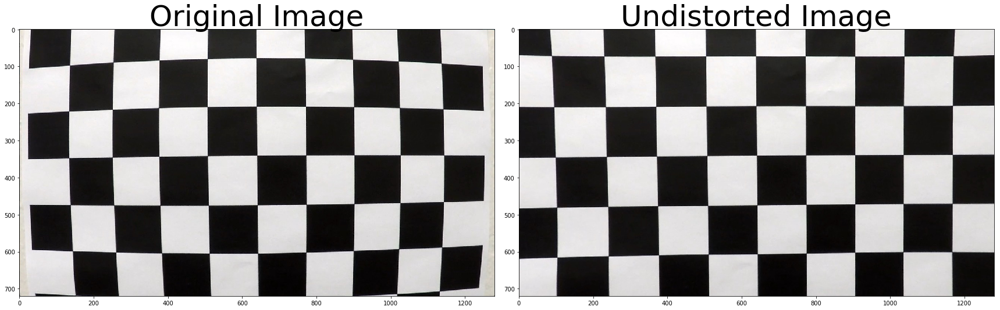

In [4]:
img = mpimg.imread('camera_cal/calibration1.jpg')
undistorted = calib.undistort(img,calibrators)

show2(img, undistorted, 'Original Image', 'Undistorted Image',path='undistortion.jpg')
img = mpimg.imread('test_images/straight_lines2.jpg')

### Perspective Transform
Now that the images are undistorted, we can use a matrix transformation to effectively change the location from where we took the original image. The way we do this is by first picking some points on an image. We then pick some points on a destination grid in which we want our image points to eventually go to. We then use linear algebra to solve for the matrix transformation that will map our image points to the destination points. This matrix can then be used for every point on the original image. Each point gets mapped to the destination effectively changing the perspective of the image. See the [get_transform and change_persp](./calibration.py) functions for details on code implementation.

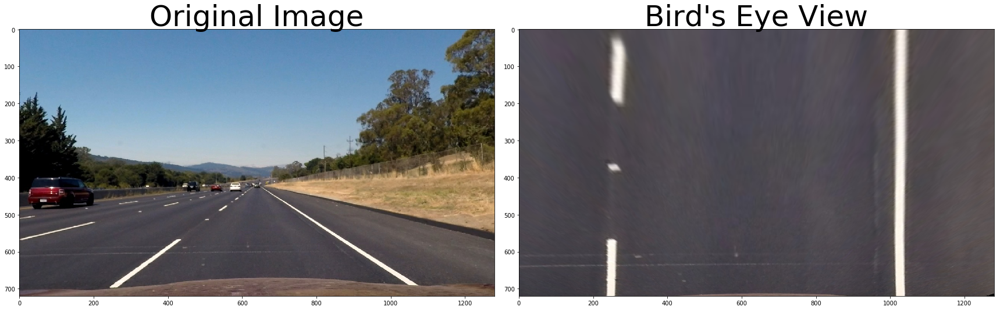

In [5]:
img = mpimg.imread('test_images/straight_lines2.jpg')
img = calib.undistort(img,calibrators)

# The source points are picked from an image by hand
src_pts = np.float32([[277,680],[555,475],[727,474],[1049,680]]) # Manually picked..
# The destination points are picked to give the perspective we desire. In this case a bird's eye view of the road.
M,M_rev = calib.get_transform(src_pts,img.shape)
birds_eye = calib.change_persp(img,M)
show2(img, birds_eye, 'Original Image', 'Bird\'s Eye View',path='output_images/birdseye.jpg')

### Color Filtering
The next step is to filter the image to isolate the lane lines. In order to do this, I first convert the image from RGB to HLS (hue, lightness, saturation). I then isolate the saturation because this is where the lane lines are most visible. See [filters](./filters.py) for source code.

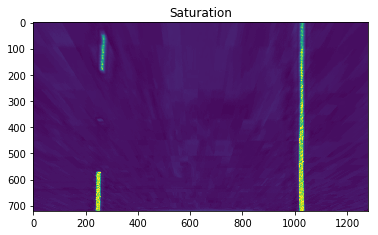

In [6]:
sat_birdseye = filters.get_saturation(birds_eye)
show1(sat_birdseye, 'Saturation',path='output_images/saturated.jpg')

After filtering for saturation, I then use the OpenCV sobel operator to get the horizontal gradient and the magnitude of the color gradient from all directions. Finally, I overlay the gradients on the saturation image and keep only the pixels that are non-zero in more than one of the filters.

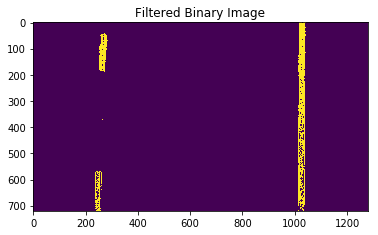

In [7]:
filt_img = filters.filter(birds_eye)
show1(filt_img, 'Filtered Binary Image',path='output_images/filtered.jpg')

### Fitting the Lanes
The next step in the process is fitting a polynomial to the lane lines. My approach, which was heavily inspired by the Udacity approach, was to first isolate the most likely location for the base of the lane lines by counting the non-zero pixels in each column. The largest counts were theoretically the columns containing most of the lane.

The next step was to create boxes (or windows) for each lane that slide up along the lane columns picked by the histogram. The pixels within the windowed regions are then kept and used to fit a polynomial to the lanes. See [lanes](./lanes.py) for the code.

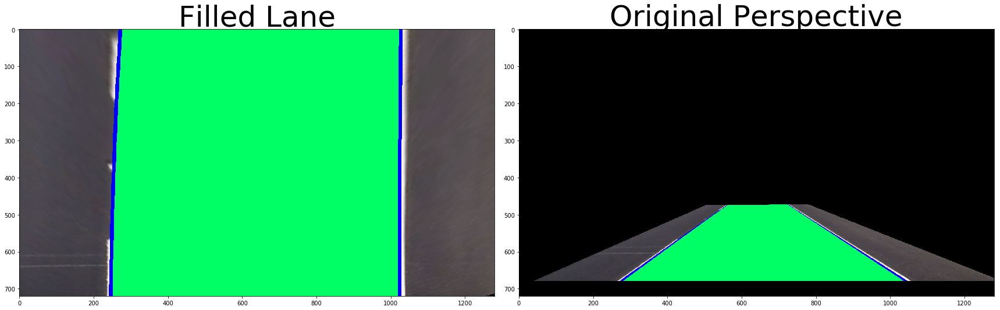

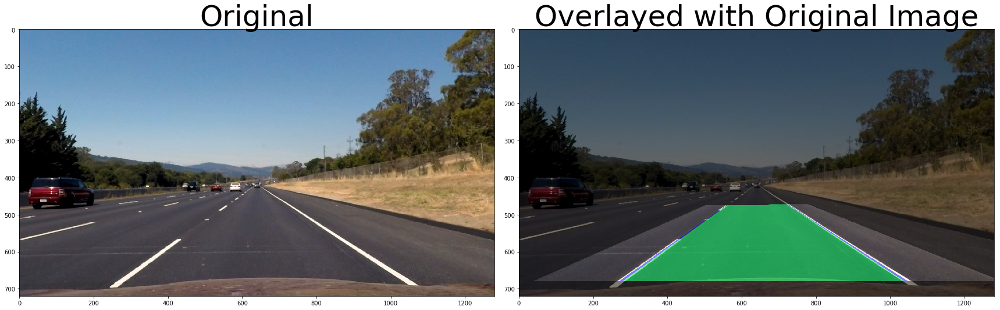

In [8]:
nonzero_left_pixels, nonzero_right_pixels = lanes.find_lane_pixels(filt_img)
filled = lanes.fill_lane(birds_eye,nonzero_left_pixels,nonzero_right_pixels)
og_persp_filled = calib.change_persp(filled,M_rev)
show2(filled,og_persp_filled,'Filled Lane', 'Original Perspective',path='output_images/filled.jpg')
overlay = lanes.overlay(img,og_persp_filled)
show2(img,overlay, "Original", "Overlayed with Original Image",path='output_images/overlayed.jpg')

### Calculating Curvature
The final step is to calculate the radius of curvature of the lane lines and the distance of the car from the lane lines. The curvature step involves some math:

R = (1 + ( f' )<sup>2</sup> )<sup>3/2</sup> / f''

Where R is the radius of curvature and f is the lane line's fitted polynomial. f' and f'' denote the first and second derivative respectively. Our polynomial fits are 2nd order which makes the derivatives relatively easy to get. Given f as our polynomial:

f = ø<sub>1</sub>x<sup>2</sup> + ø<sub>2</sub>x + ø<sub>3</sub>

f' = 2ø<sub>1</sub>x + ø<sub>2</sub>

f'' = 2ø<sub>1</sub>

Where each ø is a fitted parameter for the polynomial. We now can plug and chug to find the radial curvature. See [curve_radius](./lanes.py) for implementation details. Note that in the code, we must convert our units of measurement from pixels to meters. The conversion for the lane is found from the actual width of the lane in the US of 3.7m divided by the width in pixels, 775px.

The distance of the lanes from the car are found by assuming the car is located in the center of the image and finding the difference in pixel location of the fitted lane lines from the center of the image. We then convert to meters from pixels.

In [13]:
left_curve_radius, left_lane_position = lanes.curve_radius(nonzero_left_pixels)
right_curve_radius, right_lane_position = lanes.curve_radius(nonzero_right_pixels)
car_left_offset = lanes.car_location(left_lane_position, img.shape[1]//2)
car_right_offset = lanes.car_location(right_lane_position, img.shape[1]//2)
car_pos = abs(((1.85-car_left_offset)+(1.85-car_right_offset))/2)
print("Left Curve Radius", left_curve_radius, 'm, Distance from car:', car_left_offset,'m')
print("Right Curve Radius", right_curve_radius, 'm, Distance from car:', car_right_offset,'m')
print('Car Distance from Lane Center:',car_pos,'m')

Left Curve Radius 5187.94460925 m, Distance from car: 1.95685766571 m
Right Curve Radius 18529.4129424 m, Distance from car: 1.81673368309 m
Car Distance from Lane Center: 0.0367956743968 m


The larger the curve radius, the straighter the lines are. These values look semi-appropriate. Considering that the lanes are parallel, the differences in the curve radius is noteworthy. It may be worth averaging the two radii instead of leaving them seperate.

The relative distances of the calculated lane lines from the car, however, look appropriate.

### Process Pipeline
The following cell performs all of the steps we just walked through in a singel pipeline function. It uses the calibaration parameters and perspective transform matrices we have already calculated.

In [29]:
def img_text(img,xy,text):
    font = cv2.FONT_HERSHEY_SIMPLEX
    x,y = xy
    cv2.putText(img,text,(x,y),font, 1,(255,255,255),2,cv2.LINE_AA)


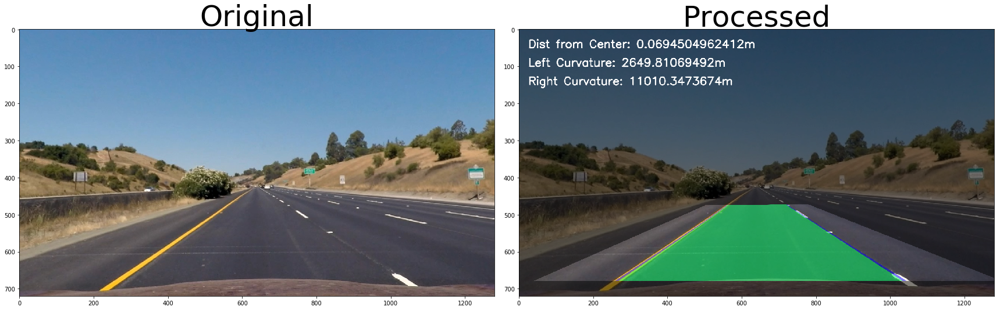

Left Curve Radius: 2649.81069492m, Distance from Car: 1.77230953724
Right Curve Radius 11010.3473674m, Distance from Car: 1.78878947028
Car Distance from Lane Center: 0.0694504962412 m


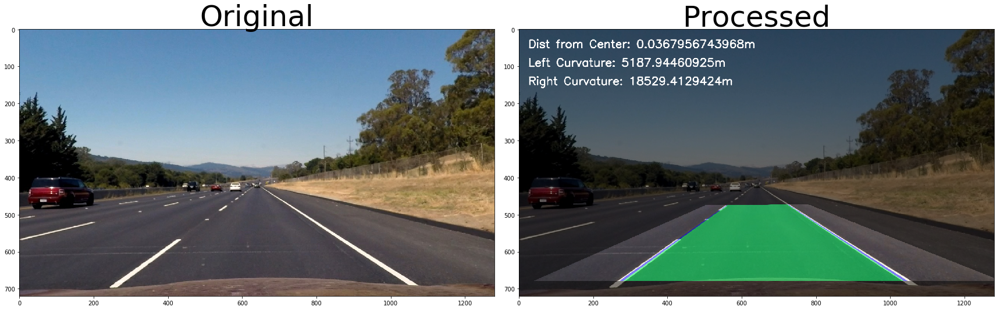

Left Curve Radius: 5187.94460925m, Distance from Car: 1.95685766571
Right Curve Radius 18529.4129424m, Distance from Car: 1.81673368309
Car Distance from Lane Center: 0.0367956743968 m


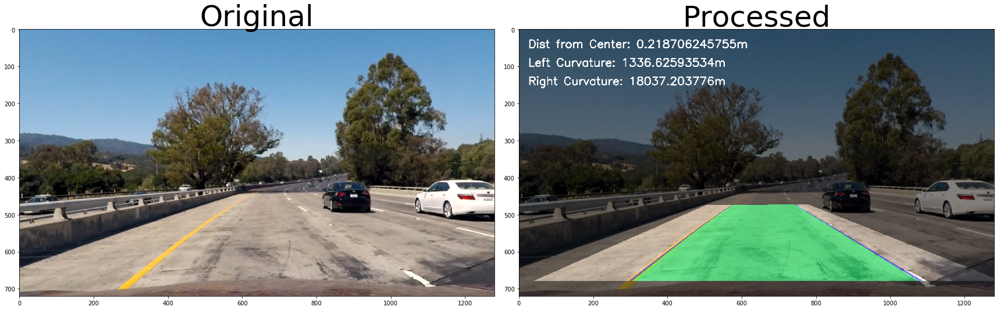

Left Curve Radius: 1336.62593534m, Distance from Car: 2.07950430586
Right Curve Radius 18037.203776m, Distance from Car: 2.05790818565
Car Distance from Lane Center: 0.218706245755 m


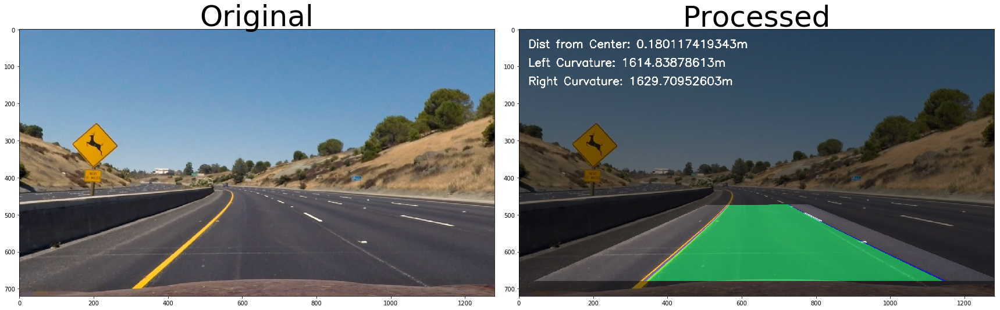

Left Curve Radius: 1614.83878613m, Distance from Car: 1.30100791162
Right Curve Radius 1629.70952603m, Distance from Car: 2.03875724969
Car Distance from Lane Center: 0.180117419343 m


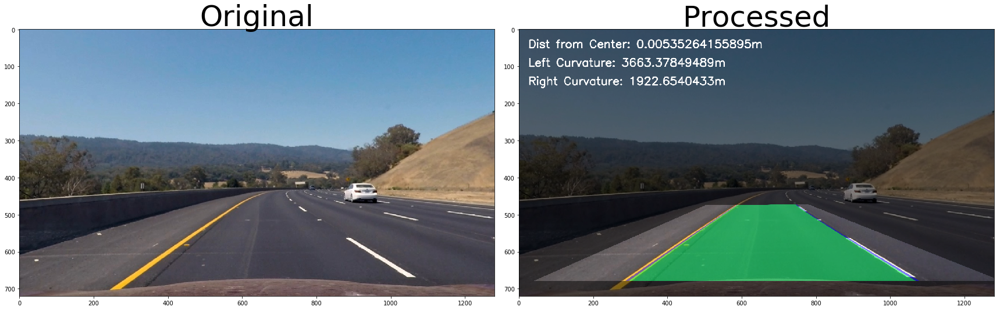

Left Curve Radius: 3663.37849489m, Distance from Car: 1.91751383806
Right Curve Radius 1922.6540433m, Distance from Car: 1.77178087882
Car Distance from Lane Center: 0.00535264155895 m


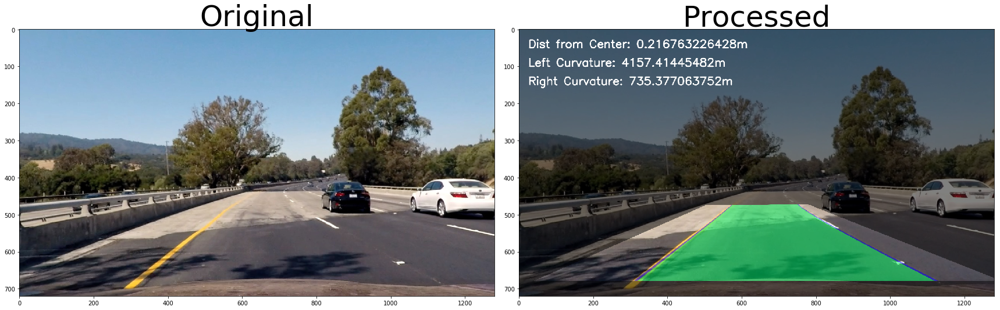

Left Curve Radius: 4157.41445482m, Distance from Car: 1.57957448705
Right Curve Radius 735.377063752m, Distance from Car: 1.6868990601
Car Distance from Lane Center: 0.216763226428 m


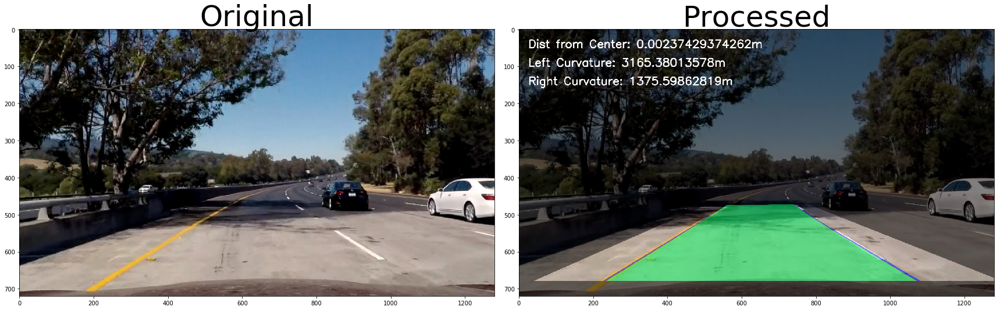

Left Curve Radius: 3165.38013578m, Distance from Car: 1.96322206187
Right Curve Radius 1375.59862819m, Distance from Car: 1.73202935065
Car Distance from Lane Center: 0.00237429374262 m


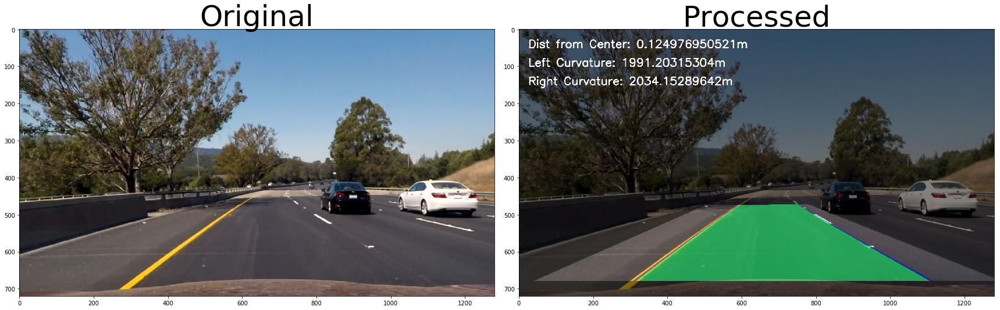

Left Curve Radius: 1991.20315304m, Distance from Car: 1.9187493005
Right Curve Radius 2034.15289642m, Distance from Car: 2.03120460054
Car Distance from Lane Center: 0.124976950521 m


In [32]:
from PIL import Image
save_folder = './output_images/'

def process_pipeline(img, calibrators=calibrators, M=M, M_rev=M_rev, save_folder=None, display=False):
    img = calib.undistort(img,calibrators)
    birds_eye = calib.change_persp(img,M)
    filt_birds_eye = filters.filter(birds_eye)
    nonzero_left_pixels, nonzero_right_pixels = lanes.find_lane_pixels(filt_birds_eye)
    filled = lanes.fill_lane(birds_eye,nonzero_left_pixels,nonzero_right_pixels)
    og_persp_filled = calib.change_persp(filled,M_rev)
    overlay = lanes.overlay(img,og_persp_filled)
    left_curve_radius, l_lane_location = lanes.curve_radius(nonzero_left_pixels)
    right_curve_radius, r_lane_location = lanes.curve_radius(nonzero_right_pixels)
    
    midpt = img.shape[1]//2
    car_left_offset = lanes.car_location(l_lane_location,midpt)
    car_right_offset = lanes.car_location(r_lane_location,midpt)
    car_pos = abs(((1.85-car_left_offset)+(1.85-car_right_offset))/2)
    img_text(overlay,(25,50),'Dist from Center: '+str(car_pos)+'m')
    img_text(overlay,(25,100),'Left Curvature: '+str(left_curve_radius)+'m')
    img_text(overlay,(25,150),'Right Curvature: '+str(right_curve_radius)+'m')
    
    if display:
        show2(img,overlay,"Original", "Processed")
    
    if save_folder:
        file_name = path.split('/')[-1]
        im = Image.fromarray(overlay)
        im.save(save_folder+file_name)
    
    return nonzero_left_pixels, nonzero_right_pixels


img_paths = inout.read_paths('./test_images')
for path in img_paths:
    img = mpimg.imread(path)
    process_pipeline(img, calibrators, M, M_rev, save_folder, display=True)
    

### Video Pipeline
The following cells run the process pipeline on each frame of an mp4 file. I have adjusted one function, however, to update the new drawn lanes from the previous set of lanes. The first image of the video is processed as normal.

In [35]:
import imageio
from IPython.display import HTML

In [34]:
def vid_pipeline(img, prev_nonz_left, prev_nonz_right, calibrators=calibrators, M=M, M_rev=M_rev):
    img = calib.undistort(img,calibrators)
    birds_eye = calib.change_persp(img,M)
    filt_birds_eye = filters.filter(birds_eye)
    nonzero_left_pixels, nonzero_right_pixels = lanes.find_lanes_update(filt_birds_eye,
                                                                        prev_nonz_left, 
                                                                        prev_nonz_right)
    filled = lanes.fill_lane(birds_eye,nonzero_left_pixels,nonzero_right_pixels)
    og_persp_filled = calib.change_persp(filled,M_rev)
    overlay = lanes.overlay(img,og_persp_filled)    
    
    left_curve_radius, left_loc = lanes.curve_radius(nonzero_left_pixels)
    right_curve_radius, right_loc = lanes.curve_radius(nonzero_right_pixels)
    
    midpt = img.shape[1]//2
    left_offset = lanes.car_location(left_loc,midpt)
    right_offset = lanes.car_location(right_loc,midpt)
    
    car_pos = abs(((1.85-left_offset)+(1.85-right_offset))/2)
    img_text(overlay,(25,50),'Dist from Center: '+str(car_pos)+'m')
    img_text(overlay,(25,100),'Left Curvature: '+str(left_curve_radius)+'m')
    img_text(overlay,(25,150),'Right Curvature: '+str(right_curve_radius)+'m')
    
    return overlay, nonzero_left_pixels, nonzero_right_pixels,left_curve_radius,right_curve_radius,car_pos

In [36]:
clip = cv2.VideoCapture("./project_video.mp4")
success, img = clip.read()
npimg = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

lpix, rpix = process_pipeline(npimg)

writer = imageio.get_writer('processed_project_video.mp4', fps=clip.get(cv2.CAP_PROP_FPS))

lcurves = []
rcurves = []
offsets = []

while success:
    npimg = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    outimg, lpix, rpix, l_curve, r_curve, car_offset = vid_pipeline(npimg, lpix, rpix)
    writer.append_data(outimg)
    lcurves.append(l_curve)
    rcurves.append(r_curve)
    offsets.append(car_offset)
    success, img = clip.read()

writer.close()
clip.release()

In [37]:
with open('curve_and_loc_data.csv','w') as f:
    f.write("Left Lane Curve Radius, Right Lane Curve Radius, Car Distance from Center of Lane\n")
    for lcurve,rcurve,offset in zip(lcurves,rcurves,offsets):
        f.write(str(lcurve)+','+str(rcurve)+','+str(offset)+'\n')

In [38]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('processed_project_video.mp4'))

### Challenge Video
The following is essentially a repeat of the last two cells, but with a more difficult lane video.

In [26]:
vid = cv2.VideoCapture("./harder_challenge_video.mp4")
success, img = vid.read()
npimg = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

lpix, rpix = process_pipeline(npimg)

vid_writer = imageio.get_writer('processed_challenge_video.mp4', fps=vid.get(cv2.CAP_PROP_FPS))

lcurves = []
ldists = []
rcurves = []
rdists = []

while success:
    npimg = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    outimg, lpix, rpix, l_data, r_data = vid_pipeline(npimg, lpix, rpix)
    vid_writer.append_data(outimg)
    lcurves.append(l_data[0])
    ldists.append(l_data[1])
    rcurves.append(r_data[0])
    rdists.append(r_data[1])
    success, img = vid.read()

vid_writer.close()
vid.release()

/Users/satchelgrant/Documents/Machine-Learning/self_driving_car/advanced_lane_finding/lanes.py:166: RankWarning: Polyfit may be poorly conditioned
  def draw_fitted_lanes(img, l_nzlane_rowcols, r_nzlane_rowcols, margin=5, params=False):
/Users/satchelgrant/Documents/Machine-Learning/self_driving_car/advanced_lane_finding/lanes.py:166: RankWarning: Polyfit may be poorly conditioned
  def draw_fitted_lanes(img, l_nzlane_rowcols, r_nzlane_rowcols, margin=5, params=False):
/Users/satchelgrant/Documents/Machine-Learning/self_driving_car/advanced_lane_finding/lanes.py:166: RankWarning: Polyfit may be poorly conditioned
  def draw_fitted_lanes(img, l_nzlane_rowcols, r_nzlane_rowcols, margin=5, params=False):


In [ ]:
with open('challenge_curve_and_loc_data.csv','w') as f:
    f.write("Left Lane Curve Radius, Right Lane Curve Radius, Car Distance from Center of Lane\n")
    for lcurve,rcurve,offset in zip(lcurves,rcurves,offsets):
        f.write(str(lcurve)+','+str(rcurve)+','+str(offset)+'\n')

In [27]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format('processed_challenge_video.mp4'))

### Potential Improvements
Whew, that was rough.. Could be improved by measuring confidence of polynomial fit and using the weighted average of the two polynomials. The center lane line is more consistent than the right which could be used to our advantage. The fitting could further be improved by enforcing the lane distance between the two fitted polynomials. This would ensure the lane width remains constant. And could perhaps further be improved with more tuned filter parameters.